In [8]:
import pytorch_lightning as pl
import pandas as pd
import numpy as np
import torch.nn as nn
from torchvision.models import densenet121
from pathlib import Path
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from monai.data import CacheDataset
from monai.transforms import Lambdad, ToTensord
from PIL import Image

data_path = Path('/home/rens/hpc/rens/output/patches/isala_primary_level4')

class ImageNetFeatureExtract(pl.LightningModule):
    def __init__(self, data_path):
        super().__init__()
        self.model = densenet121(pretrained=True)
        self.model.classifier = nn.Sequential()

        self.input = [{'path':str(p),'image':p} for p in sorted(list(data_path.iterdir()))]

        self.features = pd.DataFrame(columns=[f'feature{f}' for f in range(1024)])

    def forward(self, x):
        return self.model(x)

    def test_dataloader(self):
        transform=transforms.Compose([
            Lambdad(['image'], lambda x: np.array(Image.open(x)).transpose(2,0,1).astype(np.float32)),
            ToTensord(keys=['image'])
        ])
        ds = CacheDataset(self.input, transform=transform, cache_rate=0)
        dl = DataLoader(ds, batch_size=32, shuffle=False)
        
        return dl

    def test_step(self, batch, batch_idx):
        paths, images = batch['path'], batch['image']
        y_hat = self.model(images)
        
        for p, f in zip(paths, y_hat.cpu().detach().numpy()):
            self.features.loc[p] = f

    
    


In [9]:
model = ImageNetFeatureExtract(data_path)
trainer = pl.Trainer(gpus=1)
trainer.test(model)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 100%|██████████| 310/310 [05:04<00:00,  1.23it/s]--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Testing: 100%|██████████| 310/310 [05:04<00:00,  1.02it/s]


[{}]

In [12]:
model.features.to_csv('/home/rens/hpc/rens/output/patches/isala_primary_level4_imagenet_features.csv')

In [1]:
import pandas as pd

df = pd.read_csv('/home/rens/hpc/rens/output/patches/isala_primary_level4_imagenet_features.csv').set_index('Unnamed: 0')


In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipe = Pipeline([
    ('scaler',StandardScaler()),
    ('pca', PCA(3))
])

reduced_df = pipe.fit_transform(df)
reduced_df = pd.DataFrame(reduced_df, index=df.index, columns=['feature_0','feature_1','feature_2'])

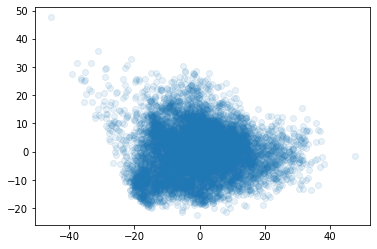

In [3]:
import matplotlib.pyplot as plt

plt.scatter(reduced_df.feature_1, reduced_df.feature_2, alpha=0.1)
plt.show()

/tmp/ipykernel_145322/2698845064.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,2, figsize=(12,6))


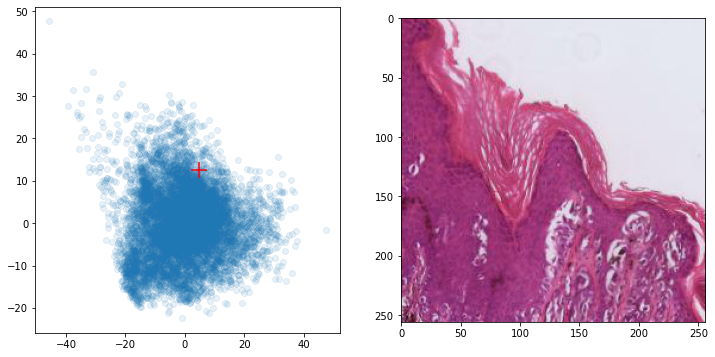

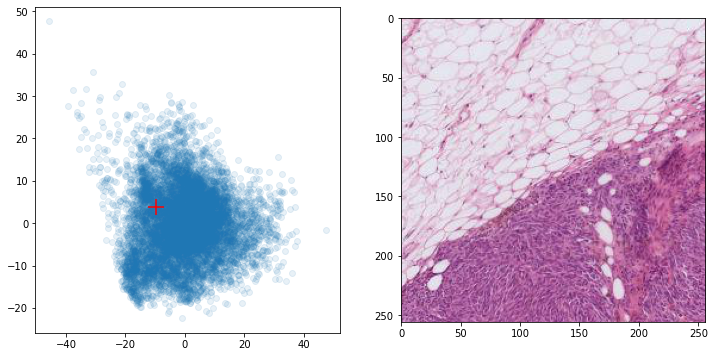

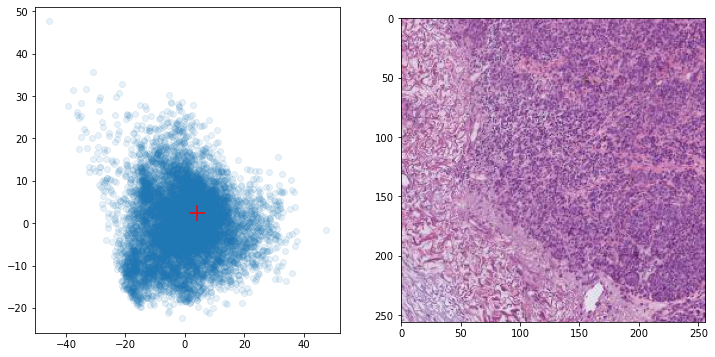

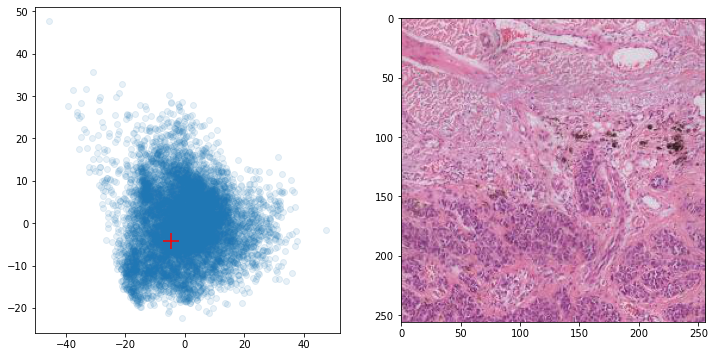

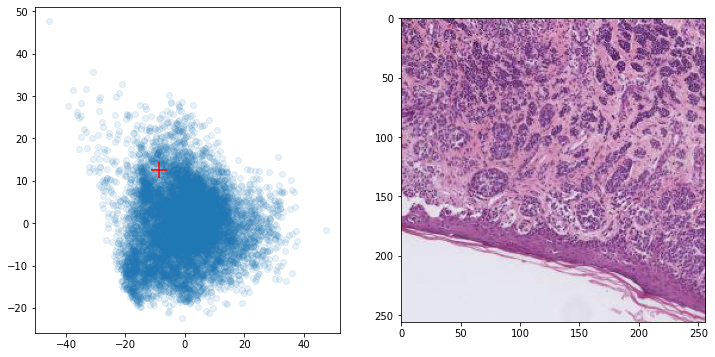

...

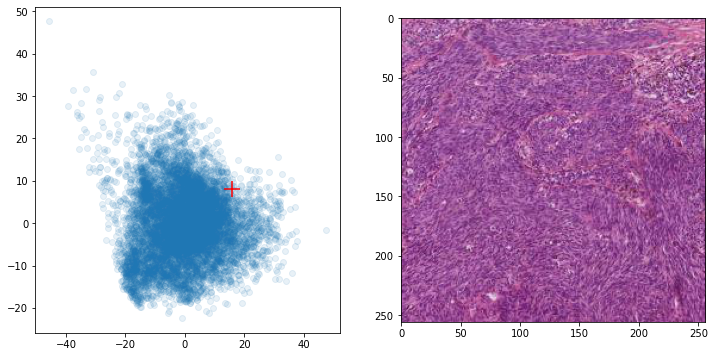

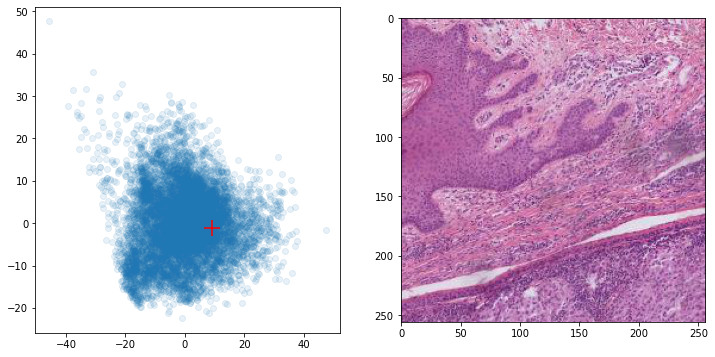

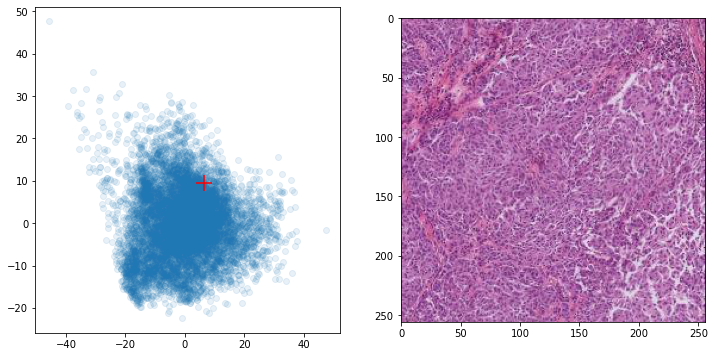

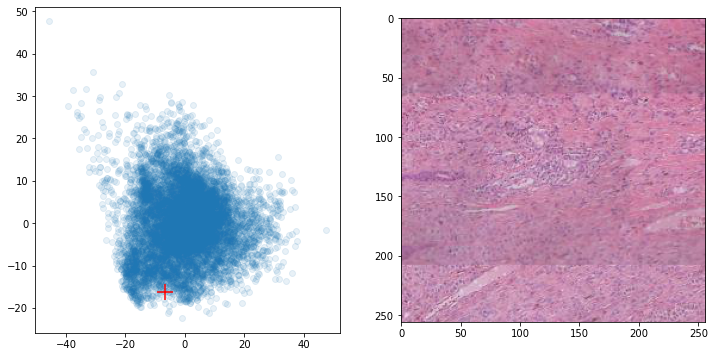

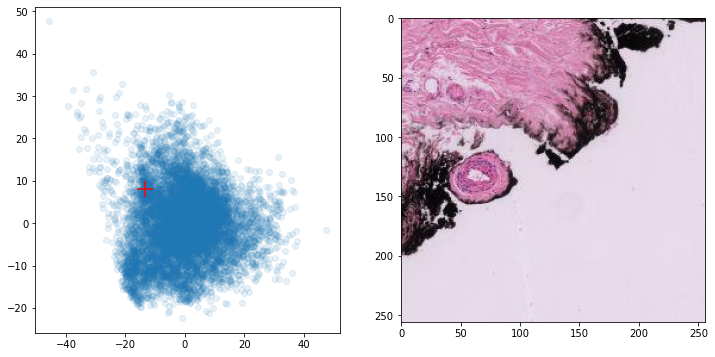

In [5]:
from PIL import Image
import numpy as np

for _ in range(25):
    sample = pd.DataFrame(reduced_df).sample(1)

    slide = np.array(Image.open(sample.index[0]).convert('RGB'))

    fig, ax = plt.subplots(1,2, figsize=(12,6))
    ax[0].scatter(reduced_df.feature_1, reduced_df.feature_2, alpha=0.1)
    ax[0].scatter(sample.feature_1,sample.feature_2,marker='+',c='r',s=250)
    ax[1].imshow(slide)
    fig.show()

In [4]:
xx,yy,slides = [],[],[]
for ix in reduced_df.index:
    xx.append(int(ix.split(' ')[-1].split('x')[-1].split('_')[0]))
    yy.append(int(ix.split(' ')[-1].split('y')[-1].split('.')[0]))
    slides.append('/home/rens/hpc/PREMIUM histopathology/data/isala/primary/' + '_'.join(ix.split('_')[:-2]).split('/')[-1] + '.ndpi')

reduced_df['x'] = xx
reduced_df['y'] = yy
reduced_df['slide'] = slides

In [5]:
normalized_df = reduced_df

normalized_df['feature_0'] = (reduced_df.feature_0 - reduced_df.feature_0.min()) / (reduced_df.feature_0.max() - reduced_df.feature_0.min())
normalized_df['feature_1'] = (reduced_df.feature_1 - reduced_df.feature_1.min()) / (reduced_df.feature_1.max() - reduced_df.feature_1.min())
normalized_df['feature_2'] = (reduced_df.feature_2 - reduced_df.feature_2.min()) / (reduced_df.feature_2.max() - reduced_df.feature_2.min())

  0%|          | 0/73 [00:00<?, ?it/s]

/tmp/ipykernel_44865/4048924271.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1, figsize=(24,12))


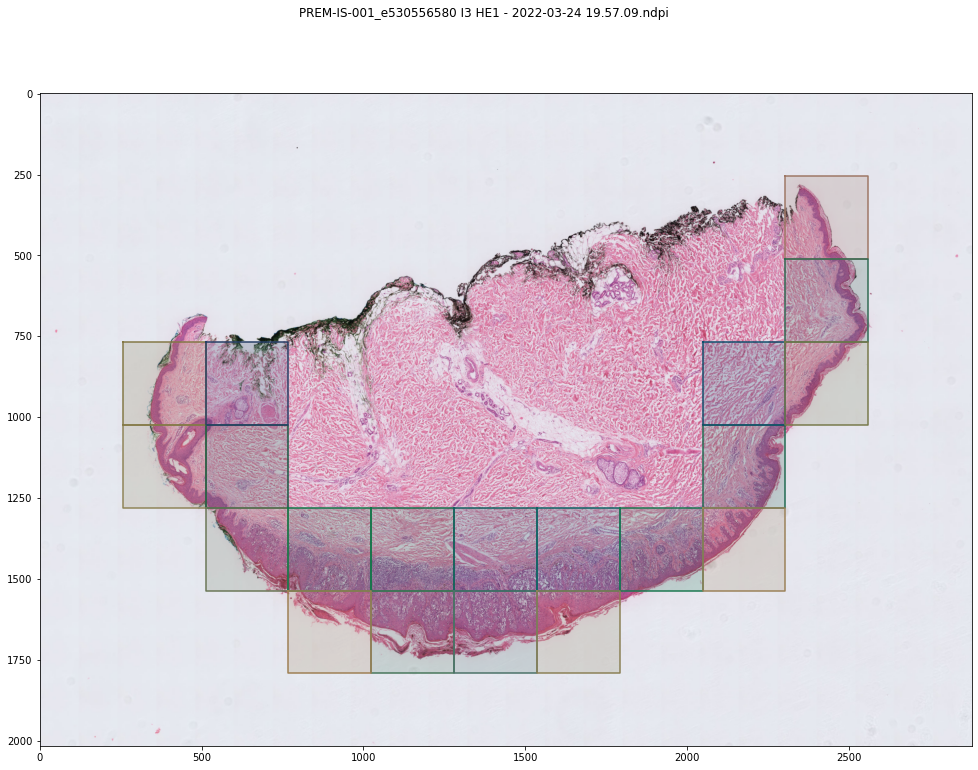

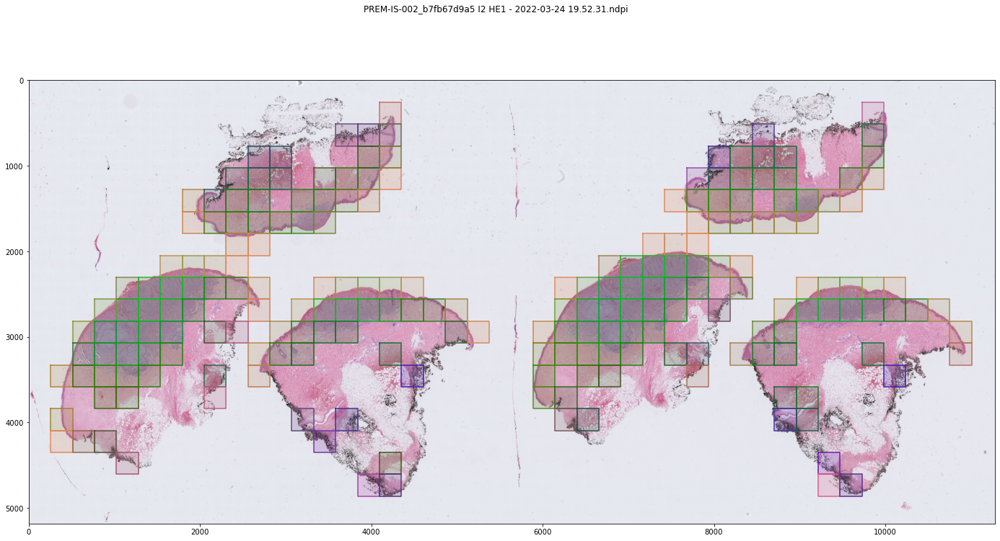

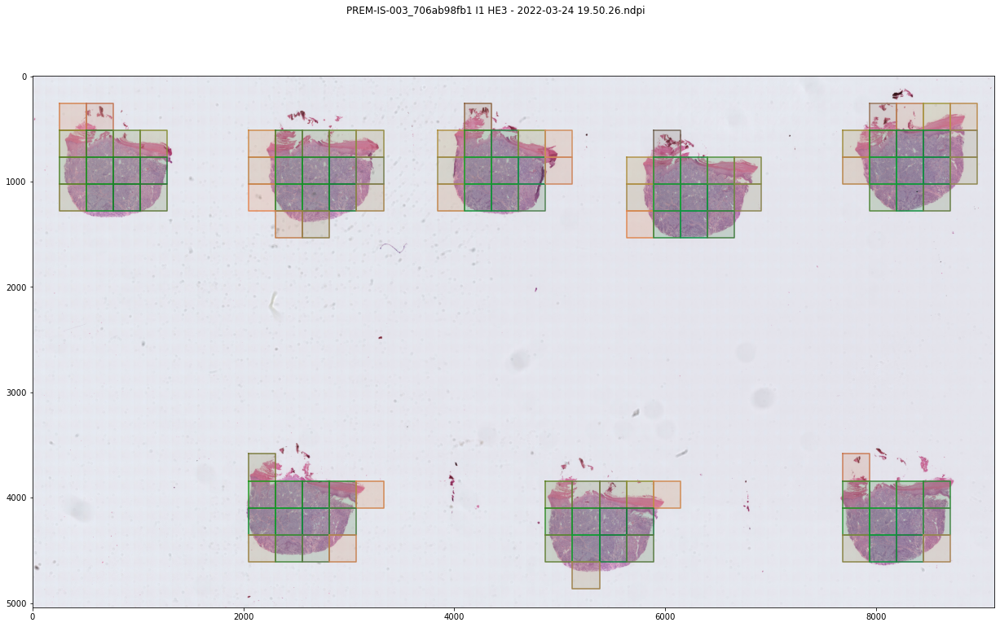

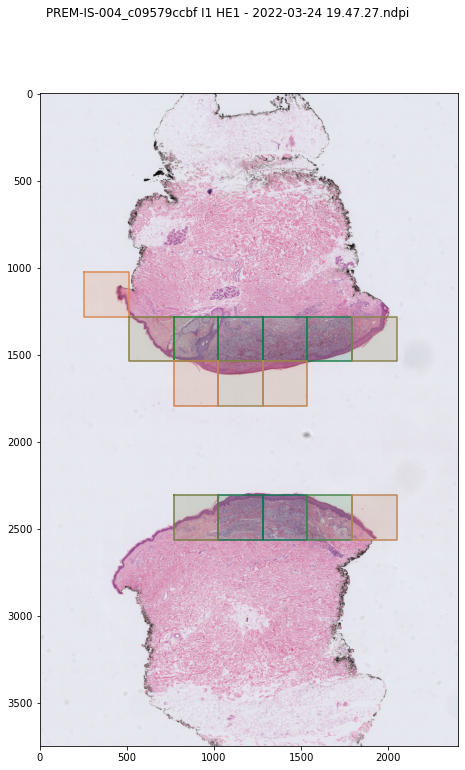

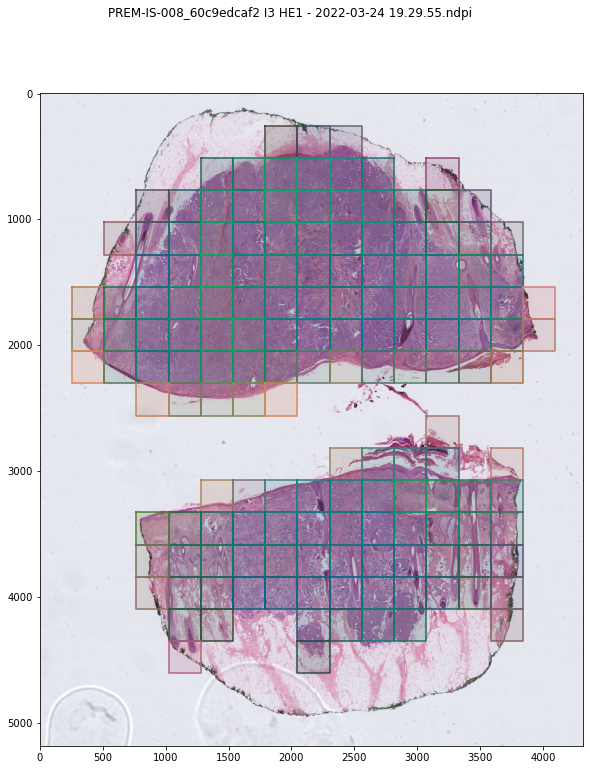

In [9]:
from openslide import OpenSlide
from matplotlib.patches import Rectangle
from tqdm.notebook import tqdm
import numpy as np

for case in tqdm(reduced_df.slide.unique()):
    slide = OpenSlide(case)
    img = np.array(slide.read_region((0,0), 4, slide.level_dimensions[4]).convert('RGB'))

    fig, ax = plt.subplots(1,1, figsize=(24,12))
    fig.suptitle(case.split('/')[-1])
    # ax[0].imshow(img)
    ax.imshow(img)
    for _, patch in normalized_df[normalized_df.slide ==  case].iterrows():
        x,y = patch['x'], patch['y']
        c = (patch['feature_0'],patch['feature_1'],patch['feature_2'])
        ax.plot(
            [y,y,y+256, y+256, y],
            [x, x+256, x+256, x, x],
            c=c
        )
        rect = Rectangle(
            (y,x), 256, 256, 
            edgecolor=None,
            facecolor=c,
            alpha=0.2
        )
        ax.add_patch(rect)
    fig.show()
